# ECE 188 Final Project

- [Github repo this project is based on](https://github.com/mnicnc404/CartoonGan-tensorflow)

## Clone github  repo
This repo contain the Python script that we will use to generate cartoon-style images.

In [1]:
import os
repo = "CartoonGan-tensorflow"
!git clone https://github.com/mnicnc404/{repo}.git
os.chdir(os.path.join(repo))

Cloning into 'CartoonGan-tensorflow'...
remote: Enumerating objects: 135, done.
remote: Counting objects: 100% (135/135), done.
remote: Compressing objects: 100% (94/94), done.
remote: Total 1577 (delta 70), reused 92 (delta 36), pack-reused 1442
Receiving objects: 100% (1577/1577), 345.94 MiB | 30.47 MiB/s, done.
Resolving deltas: 100% (675/675), done.
Checking out files: 100% (425/425), done.


In [2]:
!ls | grep cartoonize.py

cartoonize.py


## Install packages
We will need TensorFlow 2.0 and [keras-contrib](https://github.com/keras-team/keras-contrib) packages.

In [0]:
from IPython.display import clear_output, display, Image

In [0]:
!pip install tensorflow-gpu==2.0.0-alpha0
!git clone https://www.github.com/keras-team/keras-contrib.git \
    && cd keras-contrib \
    && python convert_to_tf_keras.py \
    && USE_TF_KERAS=1 python setup.py install
clear_output()

In [29]:
import tensorflow as tf
tf.__version__

'2.0.0-alpha0'

## Download new images to cartoonize
Get url of the image that you wish to transform, and paste it in the form below. You can also keep the default url and see how it work. 

Supported format of the images:
- `.jpg`
- `.png`
- `.gif`

Url of sample images
- Harry Potter: https://media.giphy.com/media/o5HKScC1PflLO/giphy.gif
- Iron man: https://media.giphy.com/media/rlsHtd2YC8k0g/giphy.gif

In [0]:
!unzip /content/data.zip

In [0]:
image_url = '/content/Apollo.gif'  #@param {type: "string"}

Download the image from the web and save it for transformation. You don't need to know all the detail here now.

In [0]:
input_image_dir = "input_images"
output_image_dir = input_image_dir.replace("input_", "output_")

import time
fnames = ['/content/data/thumb{0:04d}.jpg'.format(i) for i in range(1,241)]
for image_url in fnames:
    new_img_filename = image_url.split("/")[-1]
    image_path = os.path.join(input_image_dir, new_img_filename)

    !mv {image_url} {image_path}


In [40]:
input_image_dir = "input_images"
output_image_dir = input_image_dir.replace("input_", "output_")

import time
if image_url:
    new_img_filename = image_url.split("/")[-1]
    image_path = os.path.join(input_image_dir, new_img_filename)

    !mv {image_url} {image_path}

mv: cannot stat '/content/Apollo.gif': No such file or directory


## Cartoonize images using Python script
Transform the downloaded image using selected style.

In [0]:
styles = "hayao" #@param ["shinkai", "hayao", "hosoda", "paprika"]

In [41]:
!python cartoonize.py \
    --styles {styles} \
    --batch_size 1 \
    --comparison_view horizontal

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or 

## Compare input with the caroonized result

In [0]:
fnames = ['thumb{0:04d}.jpg'.format(i) for i in range(1,3)]
for new_img_filename in fnames:
        result_path = os.path.join(output_image_dir, "comparison", new_img_filename)

In [0]:
if new_img_filename:
    if ".gif" in new_img_filename:
        generated_gif = os.path.join(output_image_dir, "comparison", new_img_filename)
        result_path = generated_gif + '.png'
        !cp {generated_gif} {result_path}

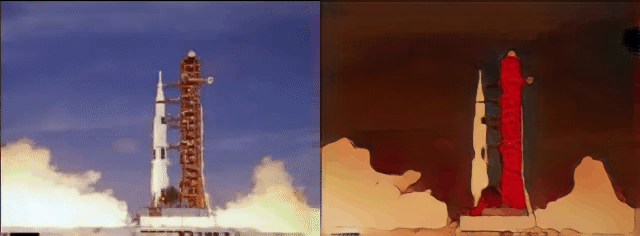

In [45]:
display(Image(result_path))

## Download the result


To download only the tranformed image , set `include_original_image` to `no`.

In [0]:
include_original_image = "no"  #@param {type: "string"}

In [0]:
from google.colab import files
!zip -r output_images/paprika.zip output_images/paprika
files.download('output_images/paprika.zip')